In [61]:
"""
Experimental notes:

channels:
    Ch2-T1 - red
    ChS2-T2 - yellow
    ChS1-T3  - green
    Ch1-T4 - cyan

There should be fewer than 200 cells per image, as few as 4

cells should exists for 1 or combinations 2 colors (not 3 or 4) - lineages will share there colors

we expect a color combination becomes the dominant lineage 

Need to check same resolution and same area on the plate

only compare same group (control) on same day
"""

'\nExperimental notes:\n\nchannels:\n    Ch2-T1 - red\n    ChS2-T2 - yellow\n    ChS1-T3  - green\n    Ch1-T4 - cyan\n\nThere should be fewer than 200 cells per image, as few as 4\n\ncells should exists for 1 or combinations 2 colors (not 3 or 4) - lineages will share there colors\n\nwe expect a color combination becomes the dominant lineage \n\nNeed to check same resolution and same area on the plate\n\nonly compare same group (control) on same day\n'

In [62]:
import pandas as pd
import numpy as np
import os
from math import sqrt
import numba
from importlib import reload

import skimage
from skimage import io
from skimage.color import rgb2gray
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.morphology import reconstruction
from skimage import color, morphology

import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

import blob_detection as _blob

In [63]:
class FileLoader():
    """ Utility class to load images into a useable structure """

    def parse_filename(self, filename):
        return {
            'filename' : filename,
            'group' : filename.split(" ")[0],
            'day' : int(filename.split("Day ")[1].split("_")[0]),
            'channel' : filename.split("_")[1].split(".")[0],
        }

    def load_imgs_from_dir(self):
        new_rows = []
        for f in os.listdir(self.path):
            file_metadata = self.parse_filename(f)

            full_path = f"{self.path}{f}"
            file_metadata['image'] = io.imread(full_path, as_gray=True)
            new_rows.append(file_metadata)

        return pd.DataFrame(new_rows)

    def __init__(self, dir_path):
        self.path = dir_path
        self.df = self.load_imgs_from_dir()

day11 = FileLoader("../test_data/")
day11.df.head()

,channel,day,filename,group,image
0,Ch2-T1,12,Control Day 12_Ch2-T1.png,Control,"[[0.0075, 0.0016666666666666666, 0.00166666666..."
1,ChS2-T2,4,Lysozyme Day 4_ChS2-T2.png,Lysozyme,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0400270..."
2,ChS2-T2,9,Control Day 9_ChS2-T2.png,Control,"[[0.0, 0.02183294117647059, 0.0218329411764705..."
3,Ch1-T4,14,Ovalbumin Day 14_Ch1-T4.png,Ovalbumin,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,Ch1-T4,12,Lysozyme Day 12_Ch1-T4.png,Lysozyme,"[[0.018529411764705885, 0.052500000000000005, ..."


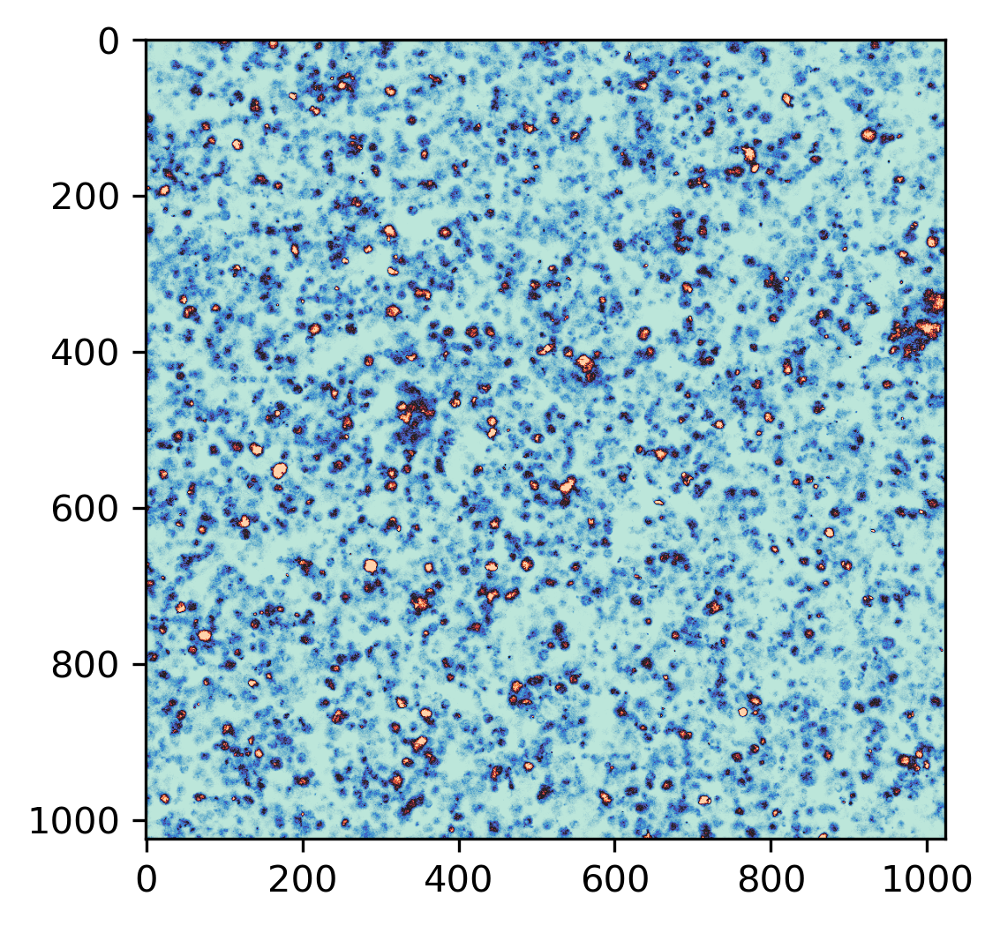

In [64]:
matplotlib.rcParams['figure.dpi'] = 300

plt.axis_off = True
plt.imshow(day11.df.iloc[0]['image'], cmap='icefire')

/Users/milk/Desktop/git_repositories/rotation_project/imaging/notebooks/blob_detection.py:19: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "preprocess_image" failed type inference due to: Untyped global name 'rgb2gray': Cannot determine Numba type of <class 'function'>

File "blob_detection.py", line 24:
def preprocess_image(image):
    <source elided>
    # and convert to normalize greyscale
    image_gray = rgb2gray(image) # convert image to grey scale
    ^

  @numba.jit


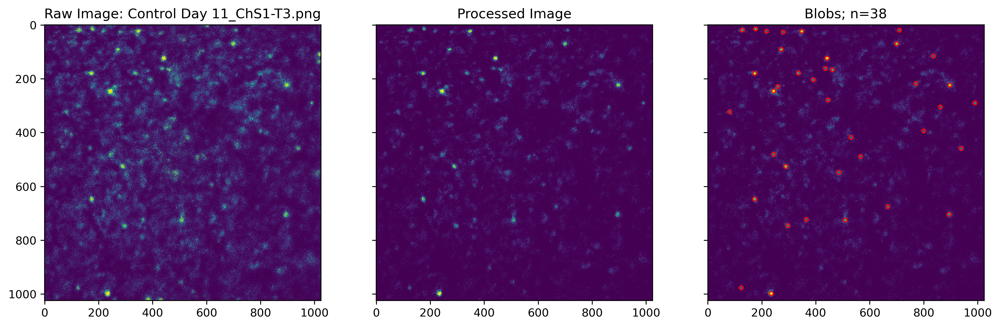

In [68]:
reload(_blob)

"""
Save Figures for all
"""
sample = day11.df.sample(1).iloc[0]
test_img = sample['image']
filname = sample['filename']

f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(15,15))
ax1.imshow(test_img) 
ax1.set_title(f"Raw Image: {filname}")

test_img = _blob.preprocess_image(test_img)
ax2.imshow(test_img)
ax2.set_title("Processed Image")

PARAMS = {
    'min_sigma' : 5,
    'max_sigma' : 40,
    'num_sigma' : 3,
    'threshold' : 0.1
}

blobs = _blob.get_LoG_blobs(test_img, PARAMS)
ax3.imshow(test_img)

for blob in blobs:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='red', linewidth=1, fill=False)
    ax3.add_patch(c)

ax3.set_title(f"Blobs; n={len(blobs)}")
plt.savefig(f"figs/BLOBS {filname}.png", bbox_inches='tight')


CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 5.96 µs


<AxesSubplot:>

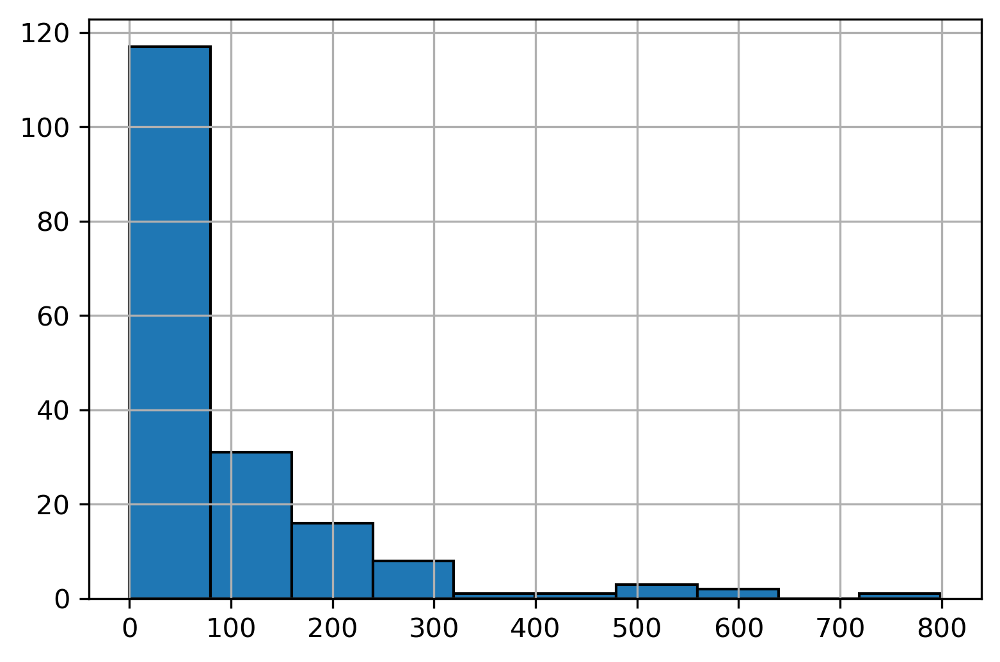

In [70]:
%time

# @numba.jit
def apply_get_LoG(row, params):
    img = _blob.preprocess_image(row['image'])
    return _blob.get_LoG_blobs(img, params)

PARAMS = {
    'min_sigma' : 5,
    'max_sigma' : 40,
    'num_sigma' : 3,
    'threshold' : 0.1
}

day11.df['LoG_blob_count_1']  = day11.df.apply(lambda x: apply_get_LoG(x, PARAMS), axis = 1)

# get counts
day11.df['n_blobs_count_1'] = day11.df['LoG_blob_count_1'].apply(len)
day11.df['n_blobs_count_1'].hist(edgecolor='black')

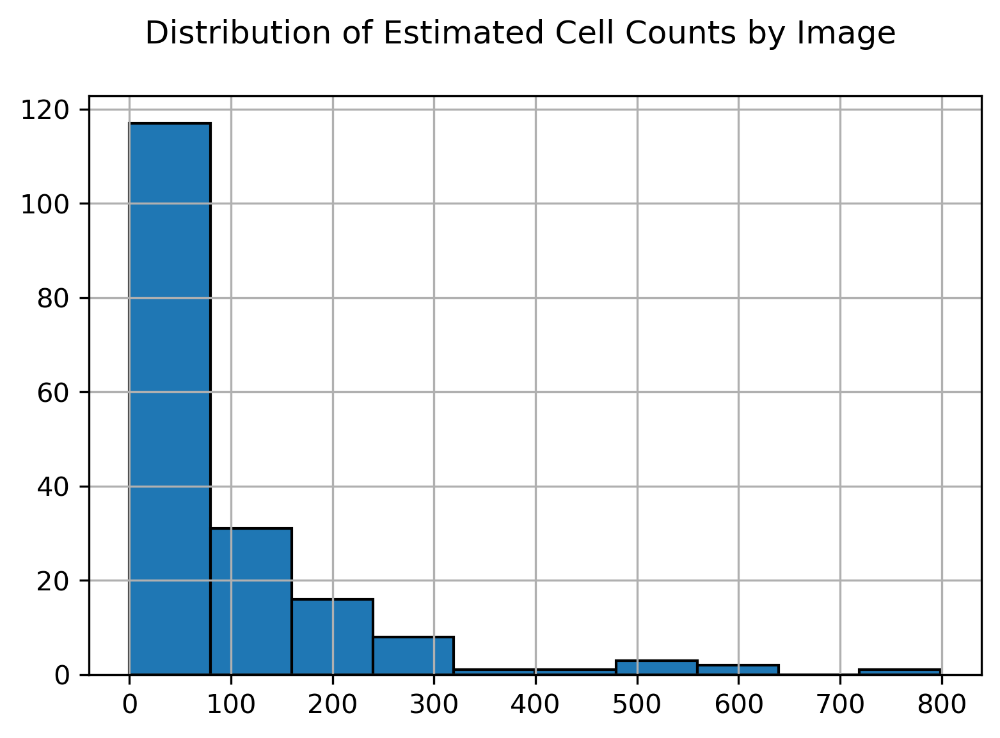

In [75]:
day11.df['n_blobs_count_1'].hist(edgecolor='black')
plt.suptitle("Distribution of Estimated Cell Counts by Image")
plt.savefig("figs/cell_count_histogram.png", bbox_inches='tight')

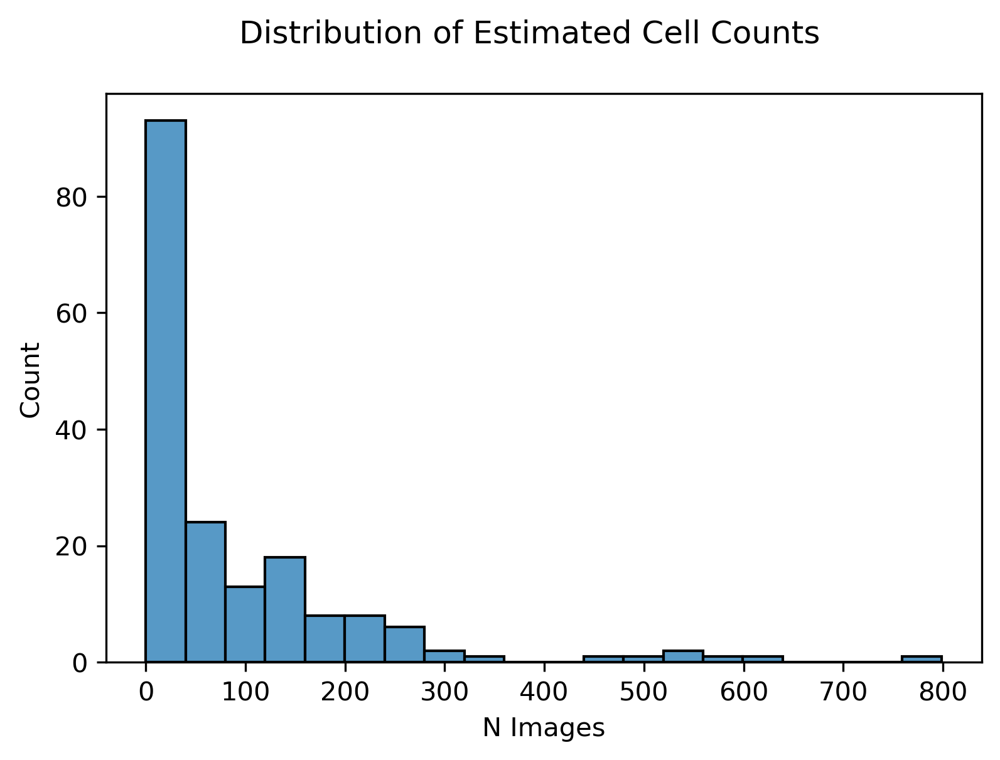

In [87]:
sns.histplot(data=day11.df, x='n_blobs_count_1')

plt.suptitle("Distribution of Estimated Cell Counts")
plt.xlabel("N Images")
plt.savefig("figs/cell_count_histogram.png", bbox_inches='tight')

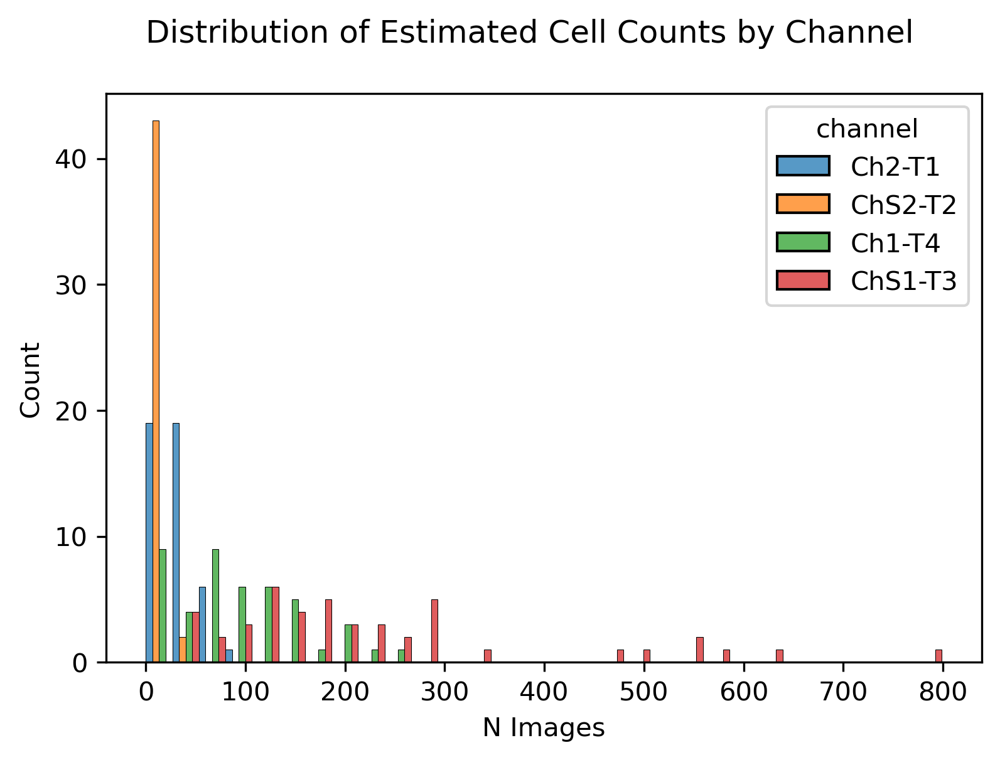

In [88]:
sns.histplot(x='n_blobs_count_1', data=day11.df, hue='channel', multiple="dodge",bins=30)
plt.xlabel("N Images")
plt.suptitle("Distribution of Estimated Cell Counts by Channel")
plt.savefig("figs/cell_count_histogram_by_channel.png", bbox_inches='tight')

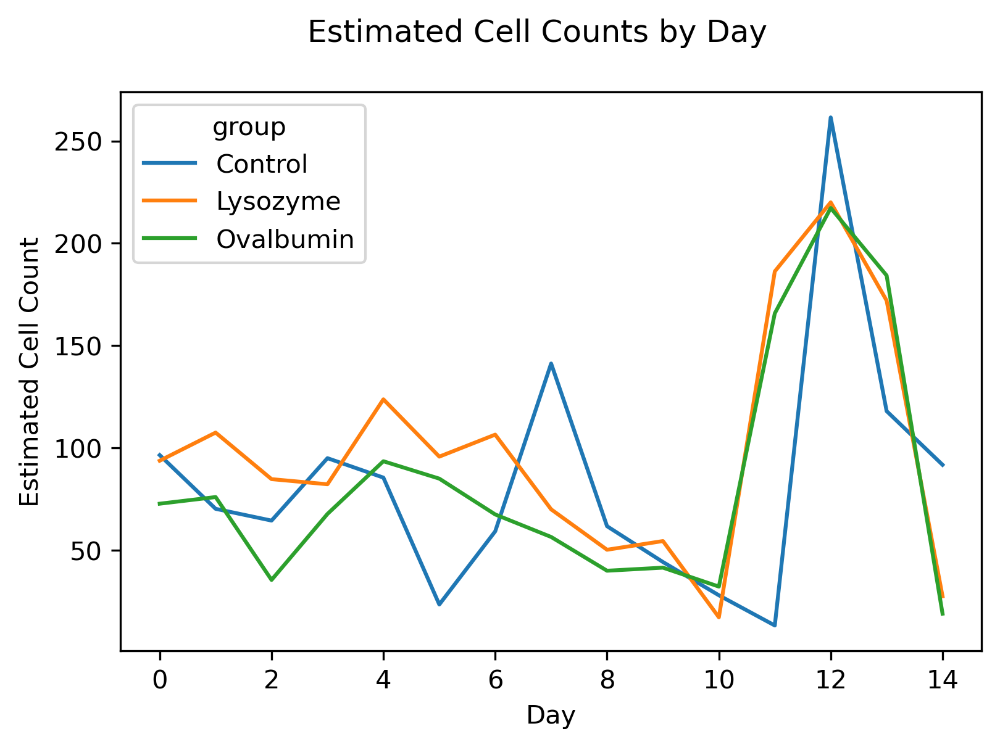

In [92]:
grouped_by_file = day11.df.groupby(['group', 'day'], as_index=False)['n_blobs_count_1'].mean()

sns.lineplot(x='day',
             y='n_blobs_count_1',
             hue='group',
             data=grouped_by_file)

plt.suptitle("Estimated Cell Counts by Day")
plt.ylabel("Estimated Cell Count")
plt.xlabel("Day")
plt.savefig("figs/cell_count_by_day.png", bbox_inches='tight')